# GFE Classification: Part C

#####  This notebook aims to use Support Vector Machines (SVM) to classify facial capture footage as a specified emotion. Data exploration, training, and modelling will all be discussed below and mitigations will be provided. 
###### (i) Train/test SVM on GFE data on a single emotion and evaluate performance measures
###### (ii) Repeat test on a different facial expression


In [1]:
import pandas as pd
import numpy as np
from sklearn import svm
from sklearn import preprocessing
from sklearn.model_selection import train_test_split,GridSearchCV,KFold, cross_val_score
from sklearn.metrics import accuracy_score, precision_score,plot_roc_curve, recall_score
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pickle

## Part 1: train affirmative emotion

In [112]:
# select emotion
emotion2 = "affirmative" 

# read in data file
df2 = pd.read_csv(f"grammatical_facial_expression/b_{emotion2}_datapoints.txt",delimiter = " ",)
df2_target = pd.read_csv(f"grammatical_facial_expression/b_{emotion2}_targets.txt",delimiter = " ",header=None)

In [113]:
# combine both dataframes using the target dataset
df2['target'] = df2_target

In [114]:
# summary statistics (exclude first/last columns)
df2.iloc[:,1:-1].stack().describe()

count    322200.000000
mean        603.406502
std         463.287527
min           0.000000
25%         256.222750
50%         323.599000
75%        1243.000000
max        1399.000000
dtype: float64

In [115]:
# search for NaN's, and remove if present
def find_nans(dataframe):
    is_NaN = dataframe.isnull()
    row_has_NaN = is_NaN.any(axis=1)
    return row_has_NaN

# remove NaN
df2 = df2.drop(df2[find_nans(df2)].index)

In [116]:
# create violin plot to see the distribution of the data
px.violin(df2.iloc[:,1:-1].unstack(), title="Violin Plot of Video Capture Data",
         labels={"variable": "Video Capture Data"})

The above graph/statistics confirms that the "affirmative" dataset has a very similar distribution to the "negative" dataset. 

Based on the success of using scaled data for the "negative" dataset, we will use only scaled data to build the model for the "affirmative" dataset.

### Train/Test Split 

In [117]:
# split train/test 70/30
X2 = df2.iloc[:,1:-1]
y2 = df2.iloc[:,-1]

# scale data
X2_scaled = (X2 - X2.min(axis=0)) / (X2.max(axis=0)-X2.min(axis=0))

### SVM Classification Optimization using K-Fold

In [118]:
# create empty model object
clf_scaled = svm.SVC()

# optimization paramters
kernel = ['linear','poly','rbf']
degree = [2,3,4,5,6,7,8,9]
C = [0.01, 0.1, 1, 10, 50]
gamma = ["scale"]
params = dict(kernel=kernel,degree=degree,C=C,gamma=gamma)

# Use GridSearch to optimize parameters through 5-Fold Cross Validation
grid = GridSearchCV(clf_scaled, params,scoring="accuracy")
best = grid.fit(X2_scaled,y2)

KeyboardInterrupt: 

In [90]:
print("Best Kernel:", best.best_estimator_.get_params()['kernel'])
print("Best Degree:", best.best_estimator_.get_params()['degree'])
print("Best C:", best.best_estimator_.get_params()['C'])
print("Best Gamma:", best.best_estimator_.get_params()['gamma'])

Best Kernel: poly
Best Degree: 2
Best C: 1
Best Gamma: scale


In [119]:
# create SVM classifier object
clf_scaled = svm.SVC(C=1, kernel='poly',degree=2,gamma="scale")

# specify the number of K-Folds
k = 5

# perform K-Fold cross validation and print the results
kfold = KFold(n_splits=k)
results = cross_val_score(clf_scaled, X_scaled, y)

print(results)
print("Accuracy: ", results.mean()*100)

[0.72870662 0.84810127 0.80379747 0.4778481  0.76582278]
Accuracy:  72.48552489717686


Using 5 K-Fold Cross Validation, the parameters were optimized as the following:
Best Kernel: poly
Best Degree: 2
Best C: 1
Best Gamma: scale

And yielded an accuracy of 87.71%

### Generate Final Model

In [120]:
# split data 80/20
X2_train_scaled, X2_test_scaled, y2_train, y2_test = train_test_split(X2_scaled, y2, random_state=3,test_size=0.2)

# create model instance / pass optimizers defined above
clf2 = svm.SVC(C=1, kernel='poly',degree=2,gamma="scale")

# fit model
clf2.fit(X2_train_scaled,y2_train)

SVC(C=1, degree=2, kernel='poly')

Model Accuracy: 0.9069767441860465
Model Precision: 0.9339622641509434
Model Recall: 0.8839285714285714


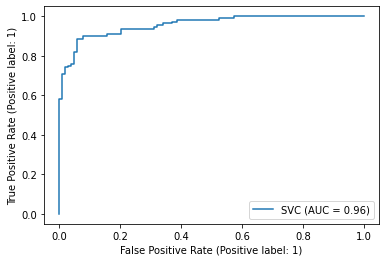

In [121]:
# make predictions on test data
y2_pred = clf2.predict(X2_test_scaled)

# calculate model accuracy
acc = accuracy_score(y2_test, y2_pred)

# calculate model precision
prec = precision_score(y2_test, y2_pred)

# calculate model recall
recall = recall_score(y2_test, y2_pred)

print("Model Accuracy:", acc)
print("Model Precision:", prec)
print("Model Recall:", recall)

# plot ROC Curve
plot_roc_curve(clf2,X2_test_scaled,y2_test)

The results of the trained model for the "affimative" dataset show 90.7% accuracy and a precision of 93.4%. A model recall value of 88.4% also very high.

The ROC curve indicates a good balance between specificity and sensitivity. 

Overall the model for predicting user B's affirmative emotions is very accurate and robust.


### Save Models

In [122]:
# save the "affirmative" model
filename = 'models/b_affirmative_svm.sav'
pickle.dump(clf2, open(filename, 'wb'))

## Part 2: Test on User A

In [123]:
# load in model
dir = "models/"
filename = (f'{dir}b_affirmative_svm.sav')
aff_svm = pickle.load(open(filename, 'rb'))

In [124]:
# select emotion
emotion2 = "affirmative" 

# read in data file for User B
df2 = pd.read_csv(f"grammatical_facial_expression/a_{emotion2}_datapoints.txt",delimiter = " ",)
df2_target = pd.read_csv(f"grammatical_facial_expression/a_{emotion2}_targets.txt",delimiter = " ",)

In [125]:
# combine both dataframes using the target dataset
df2['target'] = df2_target

# remove NaN
df2 = df2.drop(df2[find_nans(df2)].index)

In [126]:
# split data test/validation
X2 = df.iloc[:,1:-1]
y2 = df.iloc[:,-1]

# scale data
X2_scaled = (X2 - X2.min(axis=0)) / (X2.max(axis=0)-X2.min(axis=0))



Model Accuracy: 0.5135989879822896
Model Precision: 0.46932185145317545
Model Recall: 0.6123595505617978


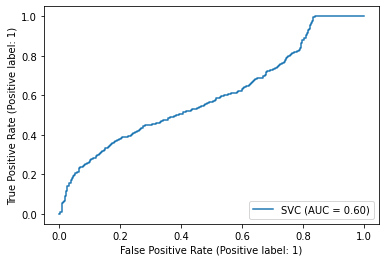

In [127]:
# test model on unseen data
y_pred = aff_svm.predict(X2_scaled)

# calculate model accuracy
acc = accuracy_score(y2, y_pred)

# calculate model precision
prec = precision_score(y2, y_pred)

# calculate model recall
recall = recall_score(y2, y_pred)

print("Model Accuracy:", acc)
print("Model Precision:", prec)
print("Model Recall:", recall)

# plot ROC Curve
plot_roc_curve(aff_svm,X_scaled,y)